- **Step 1: 读取数据**
- **Step 2: 电极定位**
- **Step 3: 插值坏导**
- **Step 4: 重参考**
- **Step 5: 滤波**
- **Step 6: 去伪迹**
- **Step 7: 分段和基线校正**
- **Step 8: 叠加平均**
- **Step 9: 时频分析**
- **Step 10: 提取数据**

# Step 1: 读取数据

In [1]:
import mne
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib qt

In [2]:
raw = mne.io.read_raw_edf('/Users/fan/Documents/Data/EEG/Fanqingchen/yy/yy2.edf')

Extracting EDF parameters from /Users/fan/Documents/Data/EEG/Fanqingchen/yy/yy2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [3]:
raw.info

<Info | 7 non-empty values
 bads: []
 ch_names: EEG Fp1-REF, EEG Fp2-REF, EEG F3-REF, EEG F4-REF, EEG C3-REF, ...
 chs: 37 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2022-09-22 14:05:01 UTC
 nchan: 37
 projs: []
 sfreq: 512.0 Hz
>

In [176]:
#修改通道名称
UM_rename_dict = {'EEG Fp1-REF': 'Fp1', 'EEG Fp2-REF': 'Fp2', 'EEG F3-REF': 'F3',
                  'EEG F4-REF': 'F4', 'EEG C3-REF': 'C3', 'EEG C4-REF': 'C4',
                  'EEG P3-REF': 'P3', 'EEG P4-REF': 'P4', 'EEG O1-REF': 'O1',
                  'EEG O2-REF': 'O2', 'EEG F7-REF': 'F7', 'EEG F8-REF': 'F8',
                  'EEG T3-REF': 'T3', 'EEG T4-REF': 'T4', 'EEG T5-REF': 'T5',
                  'EEG T6-REF': 'T6', 'EEG A1-REF': 'A1', 'EEG A2-REF': 'A2',
                  'EEG Fz-REF': 'Fz', 'EEG Cz-REF': 'Cz', 'EEG Pz-REF': 'Pz',
                  'EEG FC1-REF': 'FC1', 'EEG FC2-REF': 'FC2', 'EEG CP1-REF': 'CP1',
                  'EEG CP2-REF': 'CP2', 'EEG PO3-REF': 'PO3', 'EEG PO4-REF': 'PO4',
                  'EEG FC5-REF': 'FC5', 'EEG FC6-REF': 'FC6', 'EEG CP5-REF': 'CP5',
                  'EEG CP6-REF': 'CP6', 'EEG PO7-REF': 'PO7', 'EEG PO8-REF': 'PO8',
                  'EEG Oz-REF': 'Oz', 'EMG G_03-REF': 'G_03', 'EOG G_01-REF': 'G_01',
                  'EOG G_02-REF': 'G_02'}
raw.rename_channels(UM_rename_dict)

<RawEDF | yy2.edf, 37 x 1379328 (2694.0 s), ~39 kB, data not loaded>

In [191]:
print(raw.info)

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T3, T4, T5, ...
 chs: 34 EEG, 1 EMG, 2 EOG
 custom_ref_applied: True
 dig: 37 items (3 Cardinal, 34 EEG)
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2022-09-22 14:05:01 UTC
 nchan: 37
 projs: []
 sfreq: 512.0 Hz
>


# Step 2： 电极定位

In [177]:
raw.set_channel_types({'G_01': 'eog', 'G_02': 'eog', 'G_03': 'emg'})

<RawEDF | yy2.edf, 37 x 1379328 (2694.0 s), ~39 kB, data not loaded>

In [178]:
raw.set_montage('standard_1020', on_missing='warn')

<RawEDF | yy2.edf, 37 x 1379328 (2694.0 s), ~54 kB, data not loaded>

**绘制电极拓扑图**

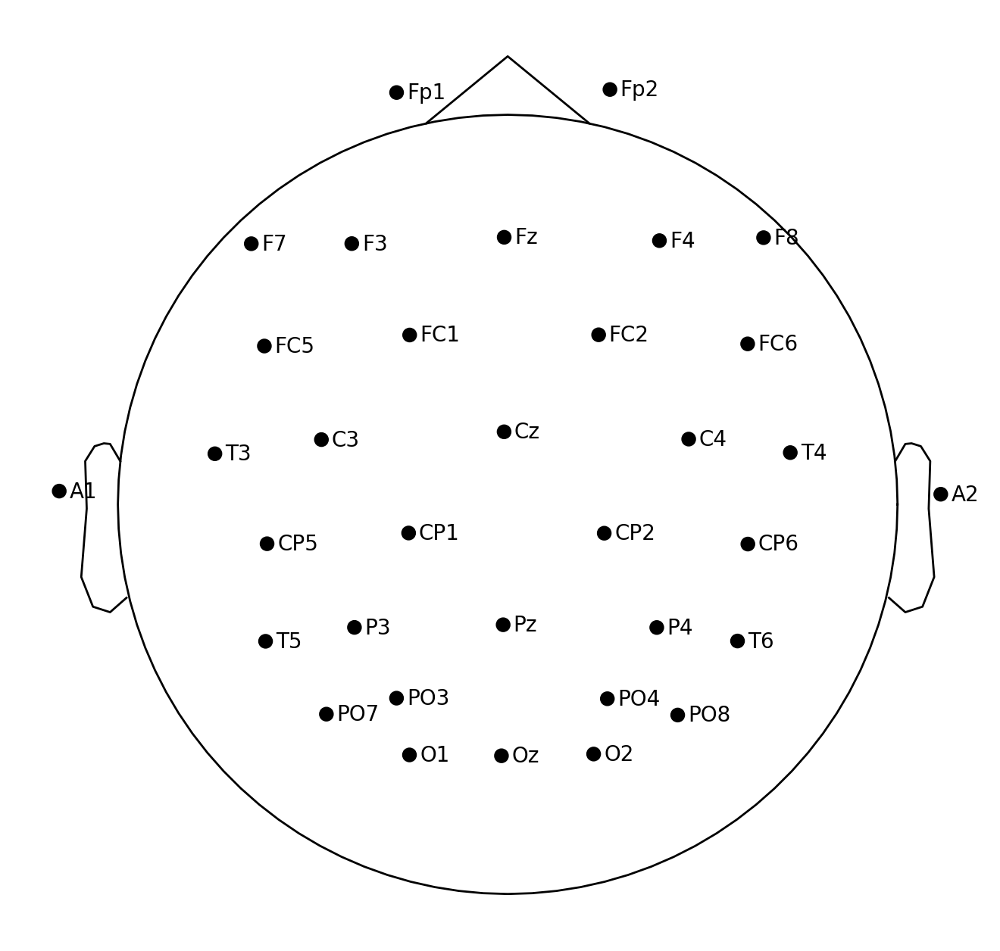

In [179]:
raw.plot_sensors(ch_type='eeg', show_names=True)

# Step 3: 插值坏导

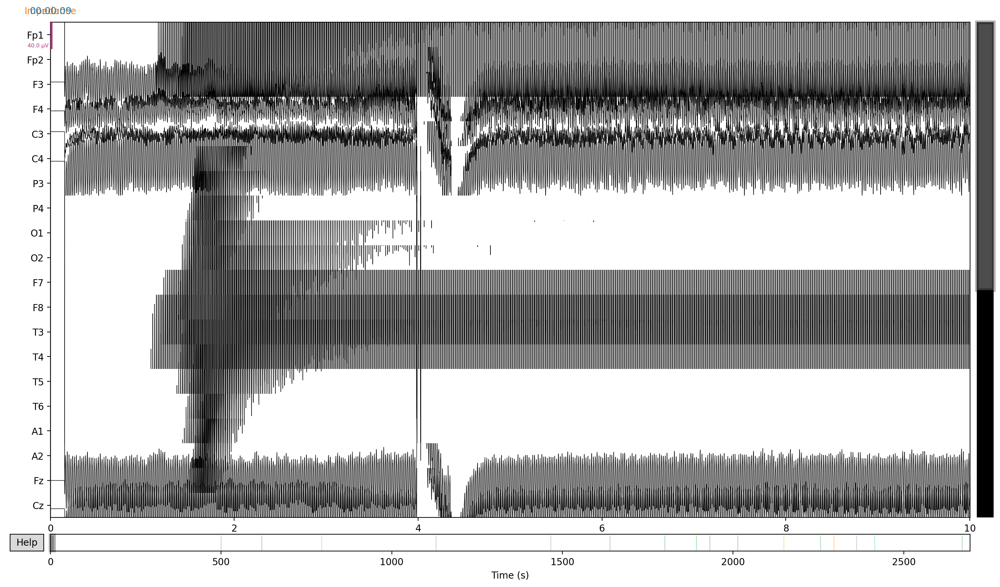

Channels marked as bad:
none


In [180]:
#以F4为坏导为例
raw.plot()

In [181]:
raw.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T3, T4, T5, ...
 chs: 34 EEG, 1 EMG, 2 EOG
 custom_ref_applied: False
 dig: 37 items (3 Cardinal, 34 EEG)
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2022-09-22 14:05:01 UTC
 nchan: 37
 projs: []
 sfreq: 512.0 Hz
>

In [182]:
#插值坏导处理
raw.load_data()
raw.interpolate_bads()

Reading 0 ... 1379327  =      0.000 ...  2693.998 secs...


/var/folders/8_/1czc2gpx4bb1qnh61rp257s40000gn/T/ipykernel_16489/616297895.py:3: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  raw.interpolate_bads()


<RawEDF | yy2.edf, 37 x 1379328 (2694.0 s), ~389.4 MB, data loaded>

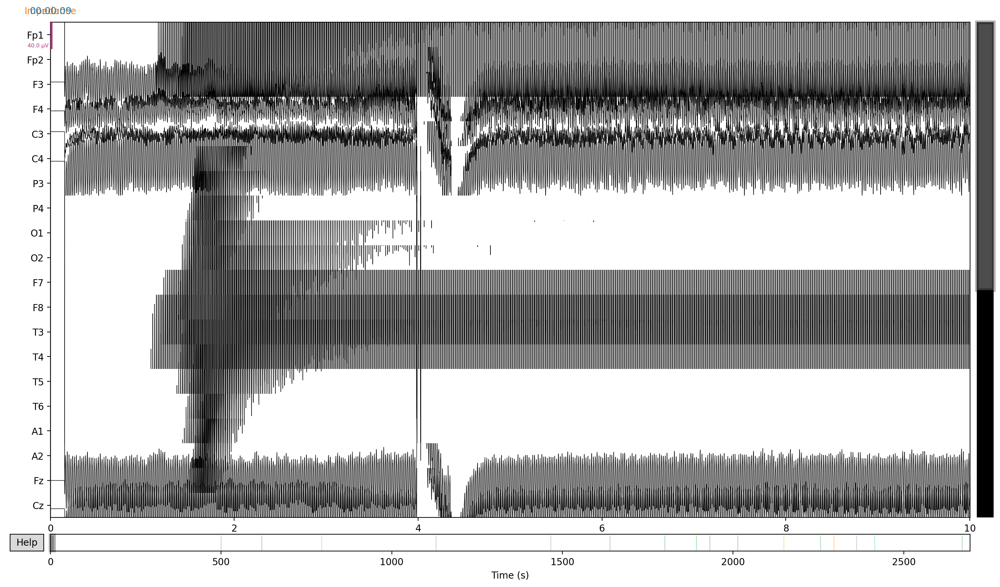

Channels marked as bad:
none


In [183]:
#查看处理后的坏导
raw.plot(title='坏导插值完成')

# Step 4: 重参考

In [184]:
# raw.set_eeg_reference(ref_channels=['M1', 'M2']) #双侧乳突
# raw.set_eeg_reference(ref_channels='REST', forward=forward)  # REST参考
raw.set_eeg_reference(ref_channels='average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEDF | yy2.edf, 37 x 1379328 (2694.0 s), ~389.4 MB, data loaded>

# Step 5: 滤波

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 0.500 (s)


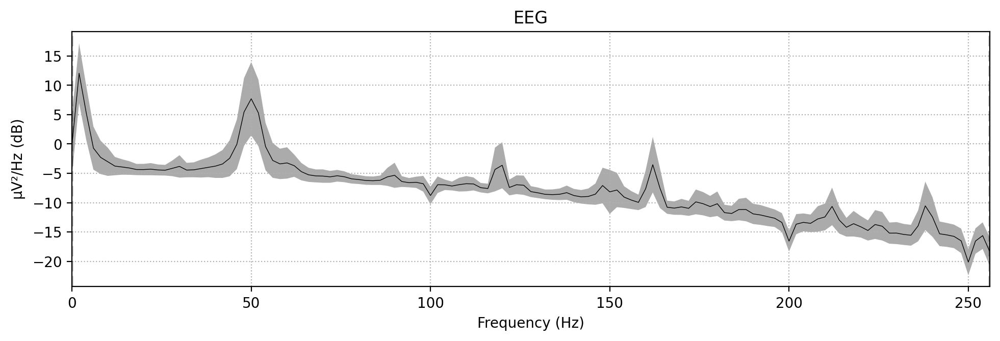

In [199]:
# 绘制功率谱图
raw.plot_psd(average=True)

通过功率谱图可以看到50Hz处可能存在环境噪音（该数据在50Hz,100Hz,150Hz,200Hz,250Hz异常）
这里首先使用陷波滤波器去掉市电干扰

Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 sec)



[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 sec)



[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 sec)



[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 0.500 (s)


[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.7s finished


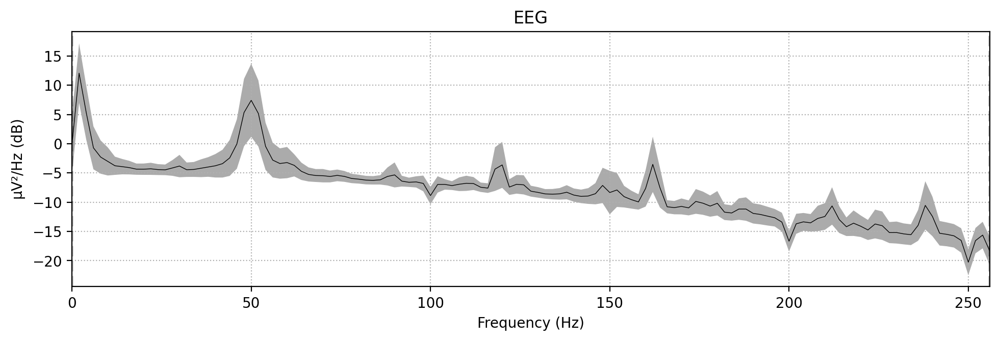

In [201]:
raw.notch_filter(freqs=(50))    
raw.notch_filter(freqs=(50))    
raw.notch_filter(freqs=(50))    
raw.notch_filter(freqs=[100,150,200,250])    

# 绘制绘制功率谱图
raw.plot_psd(average=True)  

**高低通滤波**

预处理步骤中，通常需要对数据进行高通滤波操作<br>
此处采用最常规的滤波操作，进行30Hz的低通滤波及0.1Hz的高通滤波<br>
高通滤波为了消除电压漂移，低通滤波为了消除高频噪音

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 16897 samples (33.002 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 0.500 (s)


[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.9s finished


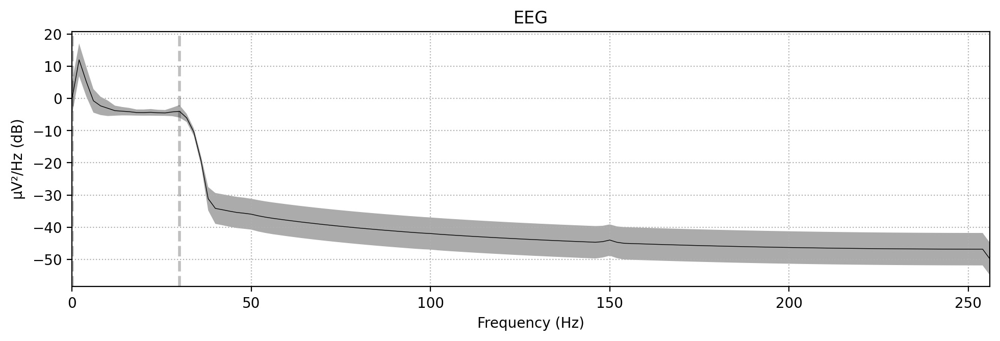

In [155]:
raw = raw.filter(l_freq=0.1, h_freq=30)
# 绘制绘制功率谱图
raw.plot_psd(average=True)

# Step 6: 去伪迹

**去坏段**<br>
MNE中可以通过打开交互式数据地形图界面，手动进行坏段标记<br>



**去坏道**<br>


In [77]:
# 坏道标记
#raw.info['bads'].append('FC5')
# 打印出当前的坏道
#print(raw.info['bads'])

**坏道插值重建**

In [78]:
#raw = raw.interpolate_bads()

**ICA去伪迹**<br>
MNE中进行ICA的编程思路是首先构建一个ICA对象<br>
然后用这个ICA分析器对脑电数据进行分析（通过ICA对象的一系列方法）<br>
由于ICA对低频分离效果不好<br>
这里对高通1Hz的数据进行ICA及相关成分剔除，再应用到高通0.1Hz的数据上<br>

In [81]:
ica = mne.preprocessing.ICA(n_components=34, method='fastica',max_iter='auto')
raw_for_ica = raw.copy().filter(l_freq=1, h_freq=None)
ica.fit(raw_for_ica)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1691 samples (3.303 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 34 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.8s finished


Selecting by number: 34 components


/Users/fan/opt/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:118: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '
/var/folders/8_/1czc2gpx4bb1qnh61rp257s40000gn/T/ipykernel_16489/131831001.py:3: RuntimeWarning: Using n_components=34 (resulting in n_components_=34) may lead to an unstable mixing matrix estimation because the ratio between the largest (31) and smallest (9.3e-29) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 33
  ica.fit(raw_for_ica)


Fitting ICA took 625.7s.


Method,fastica
Fit,1000 iterations on raw data (1379328 samples)
ICA components,34
Available PCA components,34
Channel types,eeg
ICA components marked for exclusion,—


**绘制各成分的时序信号图**

Creating RawArray with float64 data, n_channels=36, n_times=1379328
    Range : 0 ... 1379327 =      0.000 ...  2693.998 secs
Ready.


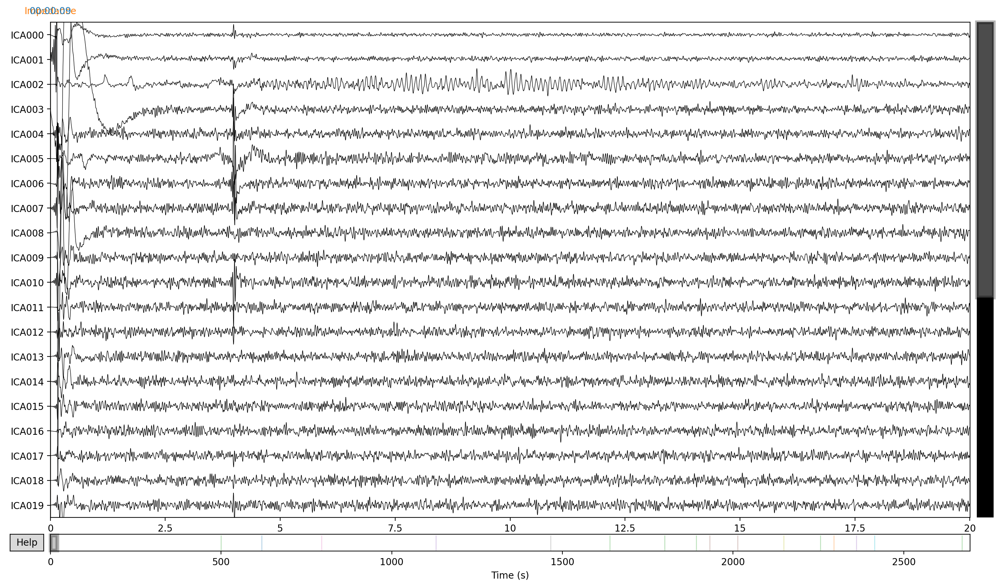

In [82]:
ica.plot_sources(raw_for_ica)

**绘制各成分地形图**

In [84]:
ica.plot_components()

[<MNEFigure size 1950x1724 with 20 Axes>,
 <MNEFigure size 1950x1462 with 14 Axes>]

**查看去掉某一成分前后信号差异**<br>
以去掉第二个成分（ICA001）为例

Applying ICA to Raw instance
    Transforming to ICA space (34 components)
    Zeroing out 2 ICA components
    Projecting back using 34 PCA components


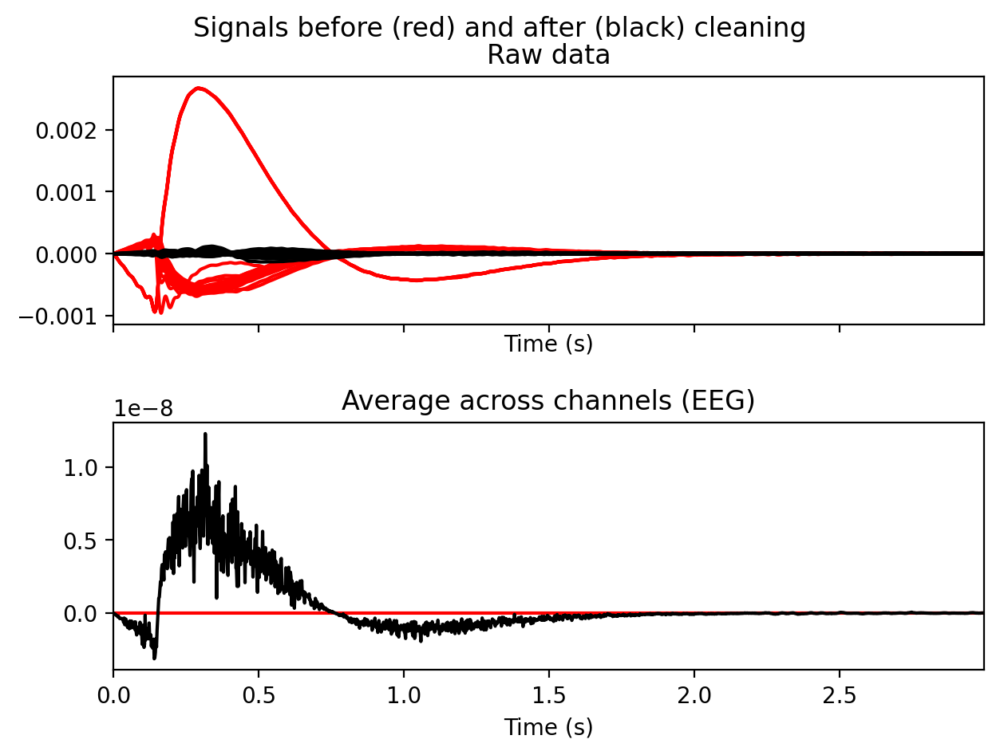

In [85]:
ica.plot_overlay(raw_for_ica, exclude=[1])

**单独可视化每个成分**<br>
这里可视化第二个成分（ICA001）和第17个成分（ICA016）

In [87]:
ica.plot_properties(raw, picks=[1, 16])

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1347 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1347 matching events found
No baseline correction applied
0 projection items activated


[<Figure size 1400x1200 with 6 Axes>, <Figure size 1400x1200 with 6 Axes>]

**剔除成分**

In [88]:
# 设定要剔除的成分序号
ica.exclude = [1]
# 应用到脑电数据上
ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (34 components)
    Zeroing out 1 ICA component
    Projecting back using 34 PCA components


<RawEDF | yy2.edf, 37 x 1379328 (2694.0 s), ~389.4 MB, data loaded>

**绘制ICA后的数据波形图**

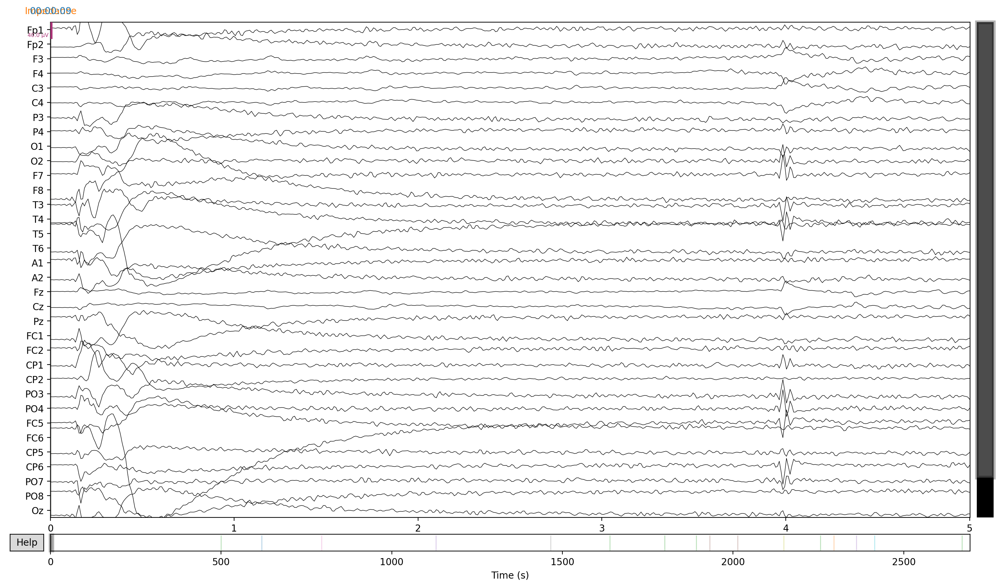

Channels marked as bad:
none


In [89]:
raw.plot(duration=5, n_channels=34, clipping=None)

# Step 7: 分段和基线校正

**提取时间信息**<br>
首先，需要确定分段需要用到的markers<br>
查看数据中的markers

In [95]:
raw.annotations

<Annotations | 18 segments: 00:00:09 (1), Impedance (1), 左手想象 (2), 开始想象动右手 ...>

In [96]:
# 基于Annotations打印数据的事件持续时长
print(raw.annotations.duration)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [97]:
# 基于Annotations打印数据的事件的描述信息
print(raw.annotations.description)

['Impedance' '00:00:09' '左手想象' '真正攥拳' '开始玩手机' '开始想象动右手' '开始真正攥右手' '结束'
 '左手想象' '结束' '开始想象右手' '结束（以上是闭眼想象）' '打网球想象' '结束' '空间想象' '结束（以上为闭眼）'
 '看一段视频' '结束']


In [98]:
# 基于Annotations打印数据的事件的开始时间
print(raw.annotations.onset)

[   0.        0.      499.9846  619.5531  794.8786 1129.8271 1465.5593
 1639.3928 1799.4077 1892.64   1931.9736 2013.6952 2147.9414 2255.703
 2295.2377 2361.596  2414.776  2670.8059]


**事件信息数据类型转换**<br>
将Annotations类型的事件信息转为Events类型

In [99]:
events, events_id = mne.events_from_annotations(raw)
print(events)
print(events_id)

Used Annotations descriptions: ['00:00:09', 'Impedance', '左手想象', '开始想象动右手', '开始想象右手', '开始玩手机', '开始真正攥右手', '打网球想象', '看一段视频', '真正攥拳', '空间想象', '结束', '结束（以上为闭眼）', '结束（以上是闭眼想象）']
[[      0       0       2]
 [      0       0       1]
 [ 255992       0       3]
 [ 317211       0      10]
 [ 406978       0       6]
 [ 578471       0       4]
 [ 750366       0       7]
 [ 839369       0      12]
 [ 921297       0       3]
 [ 969032       0      12]
 [ 989170       0       5]
 [1031012       0      14]
 [1099746       0       8]
 [1154920       0      12]
 [1175162       0      11]
 [1209137       0      13]
 [1236365       0       9]
 [1367453       0      12]]
{'00:00:09': 1, 'Impedance': 2, '左手想象': 3, '开始想象动右手': 4, '开始想象右手': 5, '开始玩手机': 6, '开始真正攥右手': 7, '打网球想象': 8, '看一段视频': 9, '真正攥拳': 10, '空间想象': 11, '结束': 12, '结束（以上为闭眼）': 13, '结束（以上是闭眼想象）': 14}


**数据分段**<br>
基于Events对数据进行分段<br>
这里提取刺激前2秒到刺激后10秒的数据，即'左手想象' marker对应-2s到10s的数据<br>
取baseline时间区间为刺激前0.5s到刺激出现<br>
并进行卡阈值，即在epoch中出现最大幅值与最小幅值的差大于2×10^-4则该epoch被剔除<br>
注意：这里的阈值设置较大，一般数据质量佳的情况下推荐设置为5×10^-5到1×10^4之间

In [100]:
epochs = mne.Epochs(raw, events, event_id=3, tmin=-2, tmax=10, baseline=(-0.5, 0), 
                    preload=True)

Not setting metadata
2 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 2 events and 6145 original time points ...
0 bad epochs dropped


In [101]:
print(epochs)

<Epochs |  2 events (all good), -2 - 10 sec, baseline -0.5 – 0 sec, ~3.5 MB, data loaded,
 '3': 2>


**分段数据可视化**

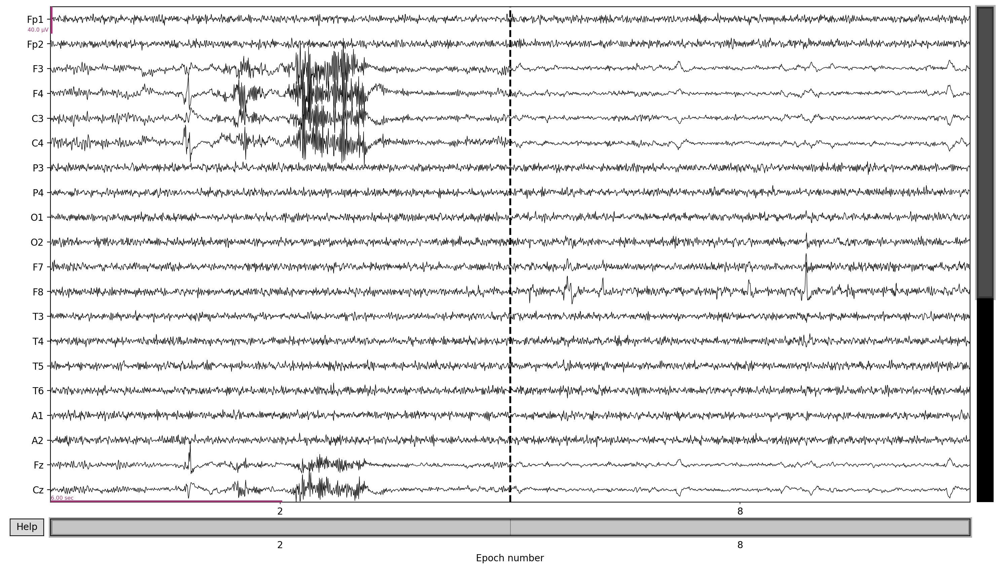

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none


In [102]:
epochs.plot(n_epochs=2)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


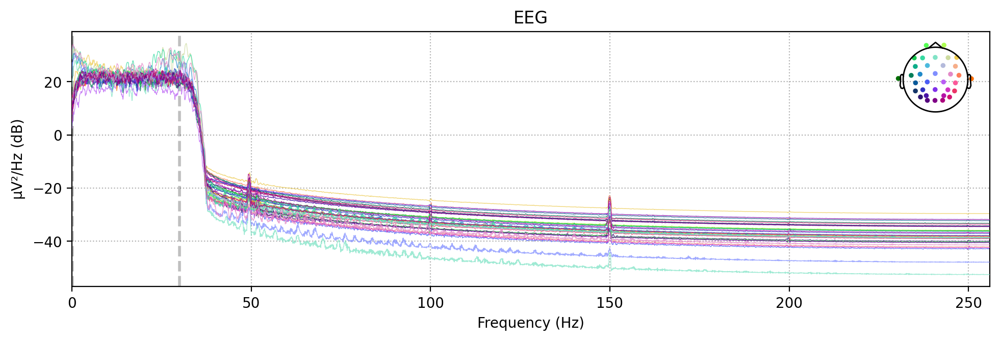

In [103]:
# 绘制功率谱图
epochs.plot_psd(picks='eeg')

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows
converting legacy list-of-tuples input to a dict for the `bands` parameter


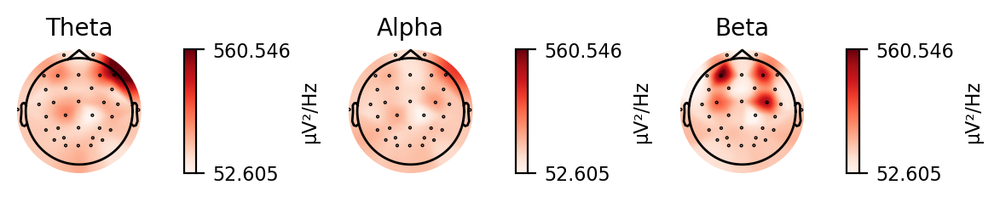

In [104]:
#绘制功率谱拓扑图（分Theta、Alpha和Beta频段）
bands = [(4, 8, 'Theta'), (8, 12, 'Alpha'), (12, 30, 'Beta')]
epochs.plot_psd_topomap(bands=bands, vlim='joint')

# Step 8: 叠加平均

MNE中使用Epochs类来存储分段数据，用Evoked类来存储叠加平均数据

**数据叠加平均**

In [105]:
evoked = epochs.average()

**可视化叠加平均后数据**

绘制逐导联的时序信号图

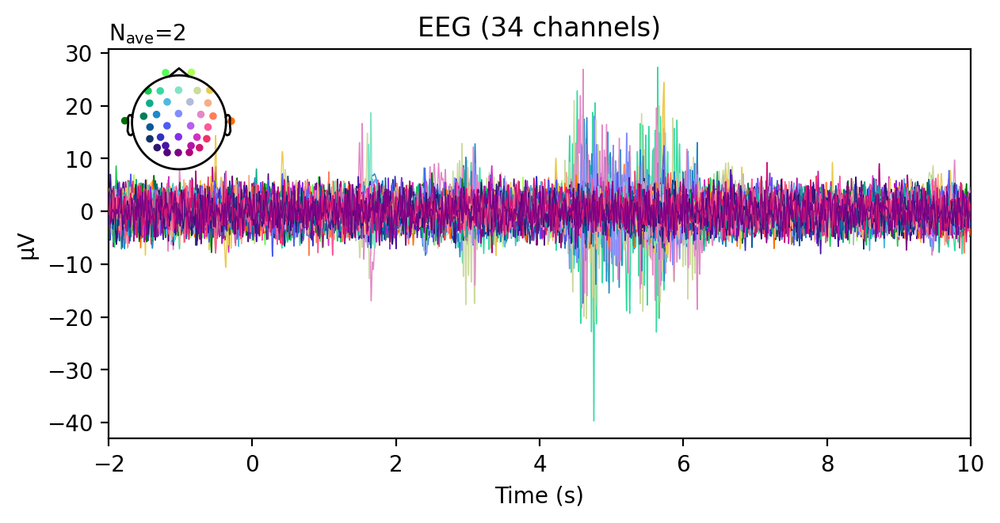

In [106]:
evoked.plot()

**绘制地形图**

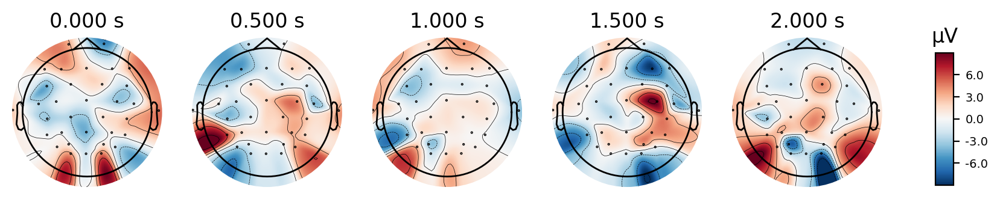

In [107]:
# 绘制0ms、0.5s、1s、1.5s和2s处的地形图
times = np.linspace(0, 2, 5)
evoked.plot_topomap(times=times, colorbar=True)

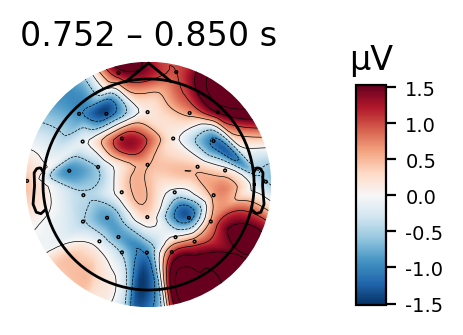

In [108]:
# 绘制某一特定时刻的地形图
# 此例绘制0.8s处，取0.75-0.85s的均值
evoked.plot_topomap(times=0.8, average=0.1)

**绘制联合图**

No projector specified for this dataset. Please consider the method self.add_proj.


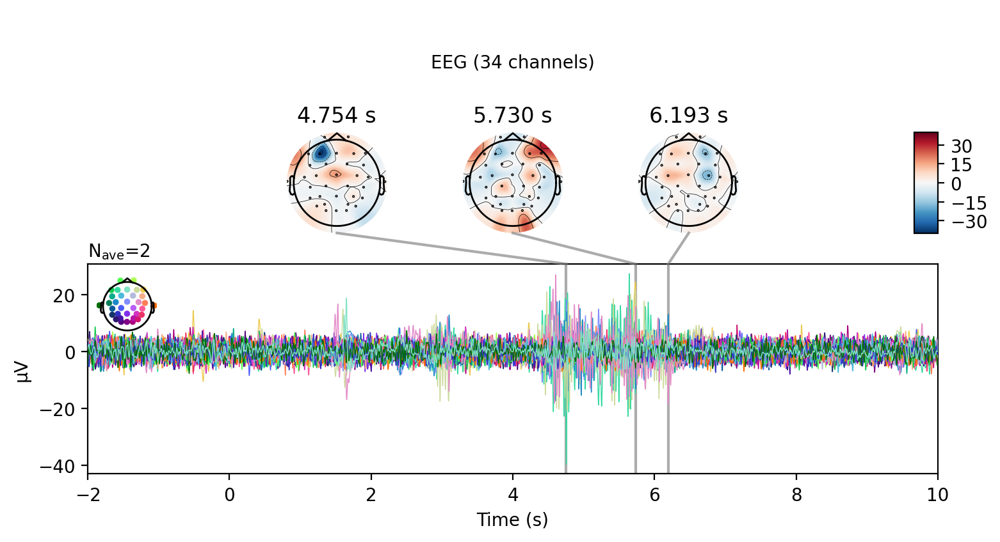

In [109]:
evoked.plot_joint()

**绘制逐导联热力图**

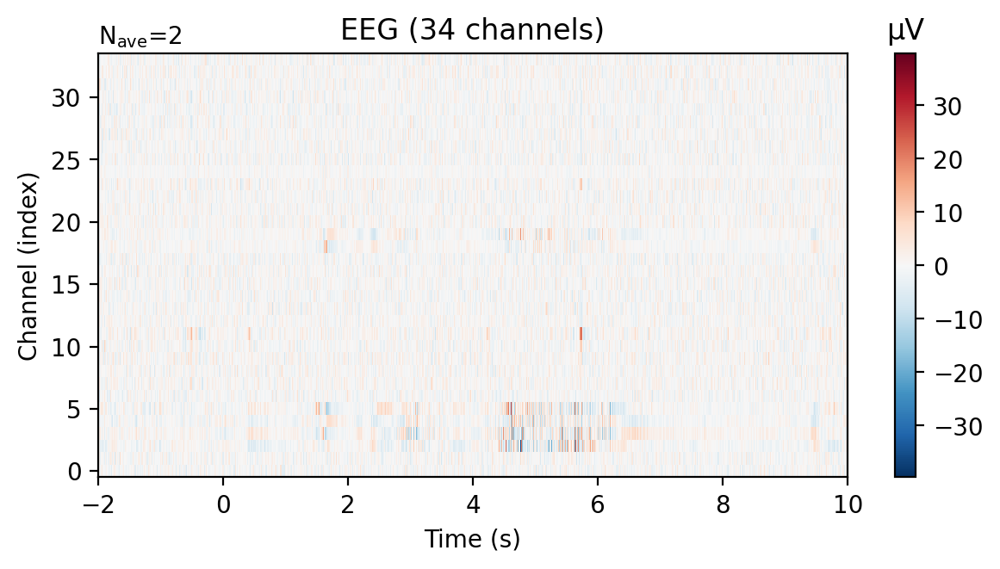

In [110]:
evoked.plot_image()

**绘制拓扑时序信号图**

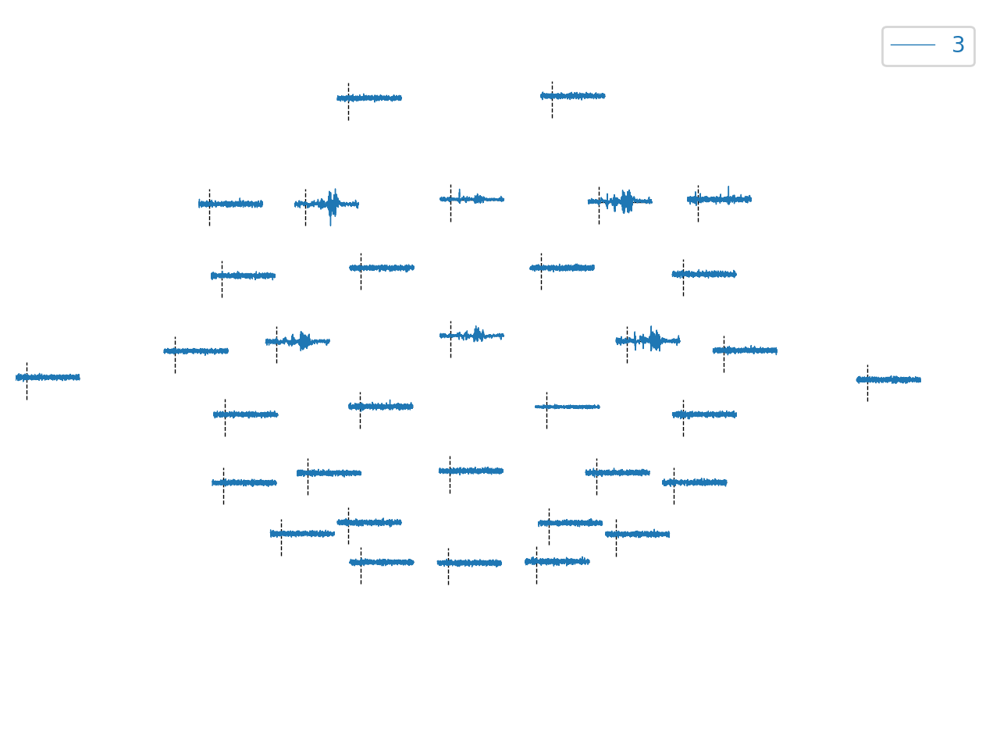

In [111]:
evoked.plot_topo()

**绘制平均所有电极后的ERP**

In [112]:
mne.viz.plot_compare_evokeds(evokeds=evoked, combine='mean')

combining channels using "mean"


[<Figure size 1600x1200 with 1 Axes>]

**绘制某一区域的平均ERP**

以枕叶为例

In [113]:
mne.viz.plot_compare_evokeds(evokeds=evoked, picks=['O1', 'Oz', 'O2'], combine='mean')

combining channels using "mean"


[<Figure size 1600x1200 with 1 Axes>]

# Step 7 时频分析

MNE提供了三种时频分析计算方法，分别是：
- Morlet wavelets，对应mne.time_frequency.tfr_morlet()  
- DPSS tapers，对应mne.time_frequency.tfr_multitaper()  
- Stockwell Transform，对应mne.time_frequency.tfr_stockwell()

**时频分析**<br>
计算能量（Power）与试次间耦合（inter-trial coherence，ITC）


In [121]:
# 设定一些时频分析的参数
# 频段选取4-30Hz
freqs = np.logspace(*np.log10([4, 30]), num=10)
n_cycles = freqs / 2.
power, itc = mne.time_frequency.tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, use_fft=True)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    0.1s finished


返回的power即为能量结果，itc即为试次间耦合结果<br>
MNE中时频分析默认返回试次平均后的结果<br>
如果想获取每个试次单独的时频分析结果，将average参数设为False即可

**时频结果绘制**<br>
MNE的时频绘图方法里可以进行多种baseline矫正方法的选择  
其对应参数为mode，包括以下一些选择：  
- 'mean'，减去baseline均值  
- 'ratio'，除以baseline均值  
- 'logratio'，除以baseline均值并取log  
- 'percent'，减去baseline均值并除以baseline均值  
- 'zscore'，减去baseline均值再除以baseline标准差  
- 'zlogratio'，除以baseline均值并取log再除以baseline取log后的标准差  

下例中选择logratio的方法进行基线校正

枕叶导联的power结果

In [122]:
power.plot(picks=['O1', 'Oz', 'O2'], baseline=(-0.5, 0), mode='logratio', title='auto')

Applying baseline correction (mode: logratio)


[<Figure size 1280x960 with 2 Axes>,
 <Figure size 1280x960 with 2 Axes>,
 <Figure size 1280x960 with 2 Axes>]

绘制枕叶导联的平均power结果

In [123]:
power.plot(picks=['O1', 'Oz', 'O2'], baseline=(-0.5, 0), mode='logratio', title='Occipital', combine='mean')

Applying baseline correction (mode: logratio)


[<Figure size 1280x960 with 2 Axes>]

绘制power拓扑图

Applying baseline correction (mode: logratio)


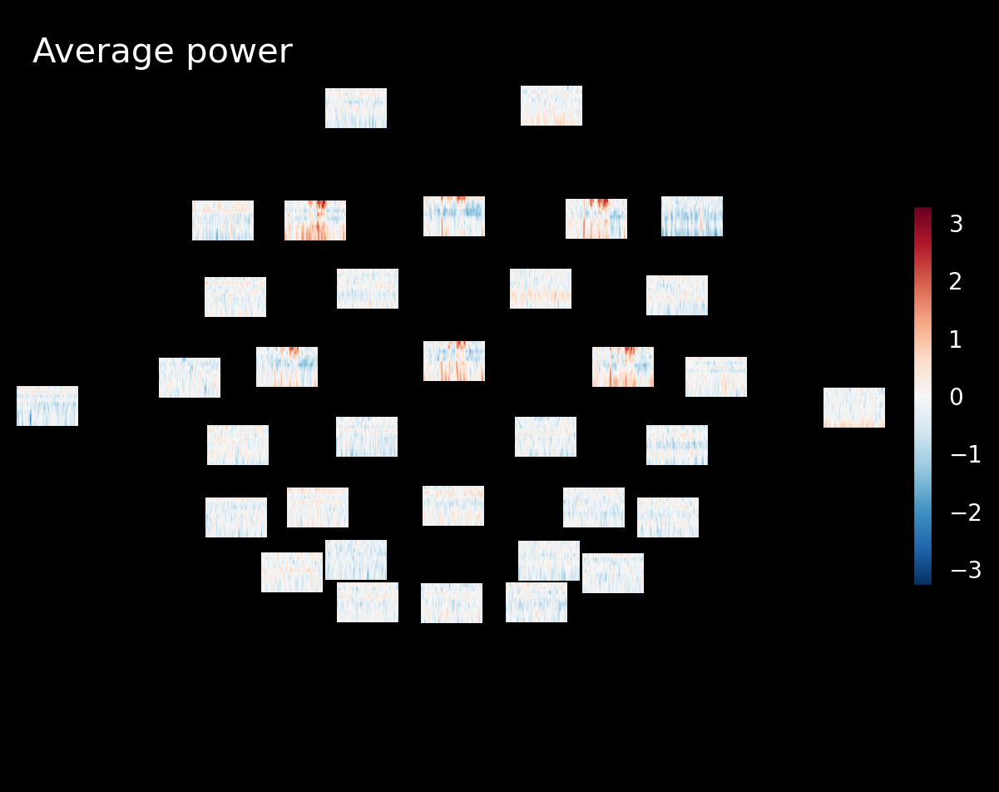

In [124]:
power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')

绘制不同频率的power拓扑图

Applying baseline correction (mode: logratio)
Applying baseline correction (mode: logratio)


/var/folders/8_/1czc2gpx4bb1qnh61rp257s40000gn/T/ipykernel_16489/3227527817.py:3: FutureWarning: The "title" parameter is deprecated and will be removed in version 1.3. Use "fig.suptitle()" instead.
  power.plot_topomap(tmin=0, tmax=0.5, fmin=4, fmax=8,
/var/folders/8_/1czc2gpx4bb1qnh61rp257s40000gn/T/ipykernel_16489/3227527817.py:5: FutureWarning: The "title" parameter is deprecated and will be removed in version 1.3. Use "fig.suptitle()" instead.
  power.plot_topomap(tmin=0, tmax=0.5, fmin=8, fmax=12,


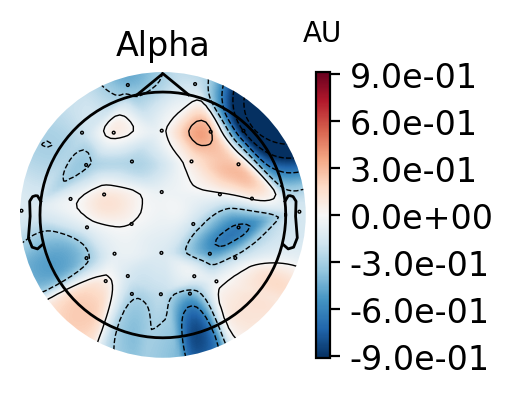

In [125]:
# 以theta power和alpha power为例
# 取0-0.5s的结果
power.plot_topomap(tmin=0, tmax=0.5, fmin=4, fmax=8, 
                   baseline=(-0.5, 0), mode='logratio', title='Theta')
power.plot_topomap(tmin=0, tmax=0.5, fmin=8, fmax=12, 
                   baseline=(-0.5, 0), mode='logratio', title='Alpha')

绘制联合图

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


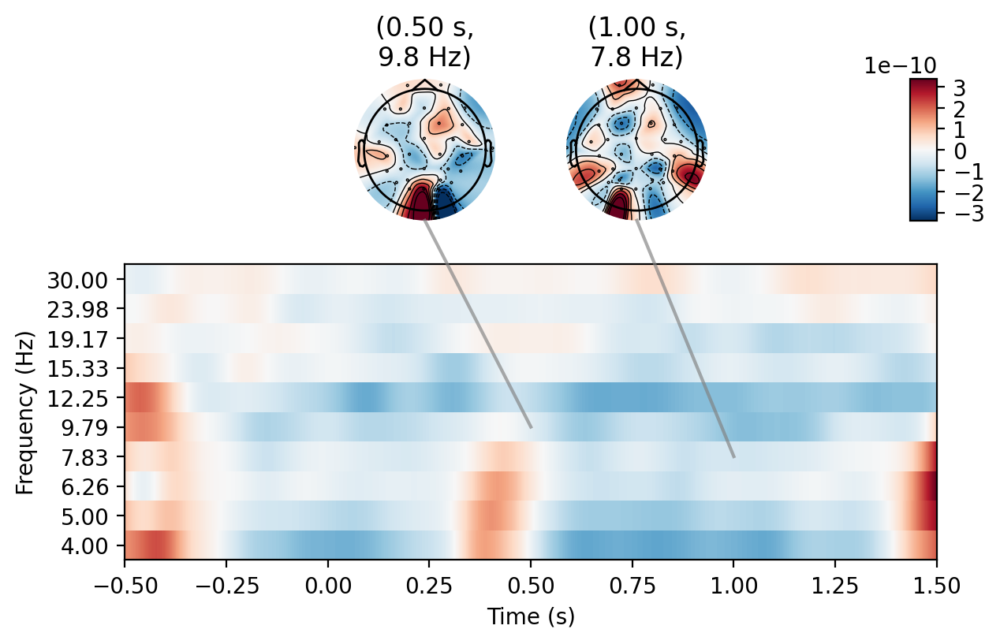

In [126]:
# 取-0.5s至1.5s的结果
# 并绘制0.5s时10Hz左右的结果和1s时8Hz左右的结果
power.plot_joint(baseline=(-0.5, 0), mode='mean', tmin=-0.5, tmax=1.5,
                 timefreqs=[(0.5, 10), (1, 8)])

ITC结果绘制类似

# Step 10: 提取数据

在进行相关计算后，往往希望能提取原始数据矩阵、分段数据矩阵、时频结果矩阵等等<br>
MNE中，Raw类（原始数据类型）、Epochs类（分段后数据类型）和Evocked类（叠加平均后数据类型）提供了get_data()方法<br>
AverageTFR类（时频分析后数据类型）提供了.data属性<br>

In [114]:
# 获取原始脑电数据
raw_data = raw.get_data()

In [115]:
print(raw_data.shape)
print(raw_data)

(37, 1379328)
[[-4.44441490e-08  4.88351707e-09  5.42769403e-08 ... -1.28286326e-08
  -2.52516908e-08 -4.48665148e-08]
 [-4.15075507e-08 -3.74180072e-08 -2.58388250e-08 ... -5.60974502e-08
  -4.93559415e-08 -4.14160740e-08]
 [ 2.01174885e-07  2.50691774e-07  2.92972799e-07 ...  2.05674505e-07
   2.03707371e-07  2.01210531e-07]
 ...
 [ 1.30542686e-05  1.32215798e-05  1.32215798e-05 ...  4.00000000e-09
   4.00000000e-09  4.00000000e-09]
 [ 2.01173363e-06  2.01173363e-06  3.01560045e-06 ...  4.00000000e-09
   4.00000000e-09  4.00000000e-09]
 [ 1.23850241e-05  1.22177129e-05  1.30542686e-05 ...  4.00000000e-09
   4.00000000e-09  4.00000000e-09]]


In [132]:
# 获取epochs数据
epochs_data = epochs.get_data(picks=['eeg'])

In [133]:
print(epochs_data.shape)
print(epochs_data)

(2, 34, 6145)
[[[-1.00033280e-06 -1.55183328e-06 -1.85645072e-06 ...  1.40028864e-07
    1.87087027e-07  1.91522951e-07]
  [ 2.02968440e-06  2.25935488e-06  2.52689039e-06 ...  3.30741859e-06
    4.55472644e-06  5.63991114e-06]
  [-1.36085296e-06 -7.89099026e-07 -3.12302348e-07 ...  1.84281166e-06
    2.24917216e-06  2.71089344e-06]
  ...
  [ 2.38180978e-06  2.40989733e-06  2.71567200e-06 ... -4.58075576e-08
   -4.35291138e-07 -8.45256400e-07]
  [ 4.70365542e-06  4.71348231e-06  4.44182335e-06 ...  5.63643708e-07
   -3.19562293e-07 -1.07097802e-06]
  [ 4.92030721e-06  6.40634886e-06  7.35261743e-06 ... -2.60024583e-06
   -3.05628779e-06 -3.47947313e-06]]

 [[-4.60007082e-06 -5.60830178e-06 -6.23162236e-06 ...  1.61361111e-06
    8.23498569e-07  1.40555460e-07]
  [ 2.93012597e-06  2.83961766e-06  2.69310237e-06 ... -1.57397282e-06
   -1.53673390e-06 -1.41678325e-06]
  [-3.82056017e-07 -8.92081437e-08  3.62065687e-07 ... -8.91527978e-07
   -1.14042011e-06 -1.30343459e-06]
  ...
  [ 8.136

即获取了NumPy Array形式的分段数据<br>
其shape为[2, 34, 6145]<br>
分别对应2个试次，34个导联和6145个时间点<br>
tips:获取eog外的导联数据，则get_data(picks=['eeg'])

In [137]:
#获取power数据
power_data = power.data

In [138]:
print(power_data.shape)
print(power_data)

(34, 10, 6145)
[[[2.11751789e-11 2.16465524e-11 2.21360068e-11 ... 3.57050134e-11
   3.52282469e-11 3.47247675e-11]
  [3.59757162e-11 3.67486837e-11 3.75245264e-11 ... 5.40035959e-11
   5.30848516e-11 5.21308552e-11]
  [4.84492903e-11 4.92180240e-11 4.99499337e-11 ... 8.48079945e-11
   8.27930336e-11 8.07532291e-11]
  ...
  [4.43750441e-12 4.91132047e-12 5.42845476e-12 ... 4.73040135e-11
   4.55211939e-11 4.37766522e-11]
  [1.02625473e-10 1.06245427e-10 1.09902462e-10 ... 1.31857446e-10
   1.26998095e-10 1.22213711e-10]
  [1.74301258e-10 1.79342949e-10 1.84348696e-10 ... 5.27487626e-11
   5.11545015e-11 4.95598651e-11]]

 [[6.93818131e-11 7.15640181e-11 7.37926746e-11 ... 7.99423463e-11
   7.88450684e-11 7.76926865e-11]
  [6.13853096e-11 6.31227433e-11 6.48765866e-11 ... 8.01184205e-11
   7.83044019e-11 7.64615219e-11]
  [3.87646852e-11 3.95392074e-11 4.03069984e-11 ... 7.39434160e-11
   7.18618424e-11 6.97791895e-11]
  ...
  [2.05448512e-10 2.10444765e-10 2.15323793e-10 ... 1.53788783